In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import anndata as ad
import scanpy as sc

from scipy import stats
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from umap import UMAP


from scroutines import basicu
from scroutines import powerplots
from scroutines.miscu import is_in_polygon

import utils_merfish
from merfish_datasets import merfish_datasets
from merfish_genesets import get_all_genesets

import importlib
importlib.reload(powerplots)
importlib.reload(utils_merfish)

<module 'utils_merfish' from '/u/project/zipursky/f7xiesnm/v1-bb/v1/myvisctx/analysis_merfish/utils_merfish.py'>

In [2]:
np.random.seed(0)

In [3]:
def binning_pipe(adata, n=20, layer='lnorm', bin_type='depth_bin'):
    """
    """
    assert bin_type in ['depth_bin', 'width_bin']
    # bin it 
    depth_bins, depth_binned = utils_merfish.binning(adata.obs['depth'].values, n)
    width_bins, width_binned = utils_merfish.binning(adata.obs['width'].values, n)

    norm_ = pd.DataFrame(adata.layers[layer], columns=adata.var.index)
    norm_['depth_bin'] = depth_binned
    norm_['width_bin'] = width_binned
    
    norm_mean = norm_.groupby(bin_type).mean(numeric_only=True)
    norm_sem  = norm_.groupby(bin_type).sem(numeric_only=True)
    norm_std  = norm_.groupby(bin_type).std(numeric_only=True)
    norm_n    = norm_[bin_type].value_counts(sort=False)

    return norm_mean, norm_sem, norm_std, norm_n, depth_binned, width_binned, depth_bins, width_bins

def binning_pipe2(adata, col_to_bin, layer, bins=None, n=20):
    """
    """
    if bins is None:
        # bin it 
        bins, binned = utils_merfish.binning(adata.obs[col_to_bin].values, n)
    else:
        binned = pd.cut(adata.obs[col_to_bin].values, bins=bins)

    norm_ = pd.DataFrame(adata.layers[layer], columns=adata.var.index)
    norm_['thebin'] = binned
    
    norm_mean = norm_.groupby('thebin').mean(numeric_only=True)
    norm_sem  = norm_.groupby('thebin').sem(numeric_only=True)
    norm_std  = norm_.groupby('thebin').std(numeric_only=True)
    norm_n    = norm_['thebin'].value_counts(sort=False)

    return norm_mean, norm_sem, norm_std, norm_n, binned, bins 

In [4]:
genesets = get_all_genesets()
genesets

{'a': array(['Met', '6530403H02Rik', 'Rhbdl3', 'Adamts2', 'Cdh13', 'Col23a1',
        'Vwc2l', 'Syt10', 'Kcnn3', 'Arhgef28', 'Pcdh19', 'Pakap', 'Ikzf2',
        'Nckap5', 'Dpyd', 'Gpc5', 'Slc6a7', 'Igsf11', 'Glis3', 'Ttc28',
        'Tenm1', 'Syt17', 'Robo1', 'Sema6a', 'Otof', 'Eda', 'Plxna1',
        'Tox3', 'Itga8', 'Kcnk13', 'Wnt4', 'Sdk2', 'Pdzrn4', 'Plxnd1',
        'Ryr3', 'Necab1', 'Camk2d', 'Iqgap2', 'Pdgfc', 'Gabrg3', 'Dscaml1',
        'Reln', 'Npas3', 'Cntn5', 'Rfx3', 'Grm1', 'Kirrel3', 'Nfib',
        'Fkbp5', 'Zfp608', 'Meis2', 'Mdga1', 'Tiam1', 'Grb14', 'Nkain3',
        'Epha6', 'Cacna1h', 'Pde1a', 'Nr3c2', 'Matn2', 'Tmem150c',
        'Adamts17', 'Ldb2', 'Egfem1'], dtype=object),
 'b': array(['Grm8', 'Galnt17', 'Epha3', 'Rgs8', 'Sox5', 'Zfp804b', 'Tmeff1',
        'Fstl5', 'Cdh4', 'Kcnip3', 'Myh9', 'Sh3pxd2b', 'Klhl1', 'Trpc6',
        'Sema4a', 'Tafa1', 'Sertm1', 'Nrp1', 'Col26a1', 'Mas1', 'Igfn1',
        'Npas4', 'Scg3', 'Nptx2', 'Bdnf', 'Phf21b', 'Nell1', 'Baz1a',
 

In [5]:
agenes = genesets['a']
bgenes = genesets['b']
cgenes = genesets['c']
iegs   = genesets['i']
up_agenes = genesets['a_up']
abcgenes = np.hstack([agenes, bgenes, cgenes])
len(abcgenes)

170

In [6]:
directories = merfish_datasets
print(merfish_datasets)

ddir = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized" 
!ls $ddir/*240411.h5ad 

{'P14NRa_ant': 'merfish_06142023/ant/region0', 'P28NRa_ant': 'merfish_06142023/ant/region1', 'P14NRa_pos': 'merfish_06142023/pos/region0', 'P28NRa_pos': 'merfish_06142023/pos/region1', 'P21NRa_ant': 'merfish_20231114/region0', 'P21DRa_ant': 'merfish_20231114/region2', 'P28DRa_ant': 'merfish_20231114/region1', 'P21NRa_pos': 'merfish_20231120/region0', 'P21DRa_pos': 'merfish_20231120/region1', 'P28DRa_pos': 'merfish_20231120/region2', 'P14NRb_ant': 'merfish_202404051211/region_0', 'P28NRb_ant': 'merfish_202404051211/region_1', 'P14NRb_pos': 'merfish_202404051214/region_0', 'P28NRb_pos': 'merfish_202404051214/region_1', 'P21NRb_ant': 'merfish_202404091526/region_2', 'P21DRb_ant': 'merfish_202404091526/region_1', 'P28DRb_ant': 'merfish_202404091526/region_0', 'P21NRb_pos': 'merfish_202404091601/region_0', 'P21DRb_pos': 'merfish_202404091601/region_2', 'P28DRb_pos': 'merfish_202404091601/region_1', 'P14NR_ant': 'merfish_06142023/ant/region0', 'P28NR_ant': 'merfish_06142023/ant/region1', 'P1

In [7]:
%%time
fin = os.path.join(ddir, 'P28NRDR_v1l23_merged_240508.h5ad')
adata = ad.read(fin) 

clst_annots = adata.uns['clst_annots']
pcs = adata.obsm['pca']
ucs = adata.obsm['umap']
r = 0.3

names = [
    'P28NR_ant', 
    'P28NR_pos',
    'P28NRb_ant', 
    'P28NRb_pos',
    
    'P28DR_ant', 
    'P28DR_pos',
    'P28DRb_ant', 
    'P28DRb_pos',
]
adata

CPU times: user 44.2 ms, sys: 232 ms, total: 276 ms
Wall time: 2.31 s


AnnData object with n_obs × n_vars = 13276 × 500
    obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'depth', 'width', 'inside_v1l23', 'sample', 'norm_transcript_count', 'jnorm_transcript_count', 'depth_show', 'width_show', 'leiden_r0.3'
    uns: 'clst_annots', 'leiden', 'neighbors'
    obsm: 'blanks', 'pca', 'umap'
    layers: 'jnorm', 'ljnorm', 'norm'
    obsp: 'connectivities', 'distances'

In [8]:
agenes_idx = basicu.get_index_from_array(adata.var.index.values, agenes)
bgenes_idx = basicu.get_index_from_array(adata.var.index.values, bgenes)
cgenes_idx = basicu.get_index_from_array(adata.var.index.values, cgenes)
igenes_idx = basicu.get_index_from_array(adata.var.index.values, iegs)

# focus on Glu neurons only

In [9]:
adata.obs['annot'] = clst_annots[adata.obs[f'leiden_r{r}'].astype(int)]
print(adata.obs['annot'].value_counts())

Glu0    3107
Glu1    2802
Glu2    2424
3       1227
4       1017
5        936
6        931
7        452
8        380
Name: annot, dtype: int64


In [10]:
adata = adata[adata.obs['annot'].str.contains('Glu')]
print(adata)
# # adata = adata[adata.obs['gncov']>100]
# print(adata)

View of AnnData object with n_obs × n_vars = 8333 × 500
    obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'depth', 'width', 'inside_v1l23', 'sample', 'norm_transcript_count', 'jnorm_transcript_count', 'depth_show', 'width_show', 'leiden_r0.3', 'annot'
    uns: 'clst_annots', 'leiden', 'neighbors'
    obsm: 'blanks', 'pca', 'umap'
    layers: 'jnorm', 'ljnorm', 'norm'
    obsp: 'connectivities', 'distances'


In [11]:
width_min = adata.obs.groupby('sample')['width'].min().reindex(names)
width_max = adata.obs.groupby('sample')['width'].max().reindex(names)
width_rng = width_max - width_min 
width_cum = pd.Series(np.cumsum(np.hstack([0, width_rng[:-1]+100])), index=names)

adata.obs['width_n0'] = adata.obs['width'] - width_min.reindex(adata.obs['sample']).values
adata.obs['width_show2'] =  adata.obs['width_n0'] + width_cum.reindex(adata.obs['sample']).values
adata.obs['depth_show2'] = -adata.obs['depth']

/tmp/ipykernel_15297/3850898509.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['width_n0'] = adata.obs['width'] - width_min.reindex(adata.obs['sample']).values


In [12]:
mat = adata[:,abcgenes].layers['ljnorm']
mat = stats.zscore(mat, axis=0)

mat_nr = adata[adata.obs['sample'].str.contains('NR'), abcgenes].layers['ljnorm']
mat_nr = stats.zscore(mat_nr, axis=0)

pca = PCA(n_components=5)
pcs_typegenes = pca.fit(mat).transform(mat)
# pcs_typegenes = pca.fit(mat_nr).transform(mat)
adata.obsm['pcs_typegenes'] = pcs_typegenes

In [13]:
xi, yi = 0, 1
xsign, ysign = 1, 1

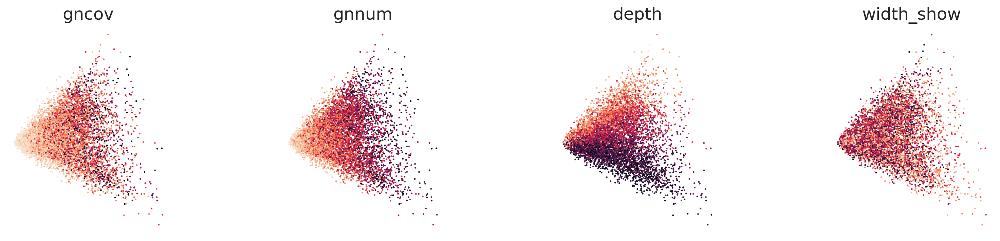

In [14]:
metrics = ['gncov', 'gnnum', 'depth', 'width_show']

fig, axs = plt.subplots(1,4,figsize=(4*5,1*4))
for metric, ax in zip(metrics, axs):
    # g = np.log10(1+adata.obs[metric])
    g = adata.obs[metric]
    x = xsign*adata.obsm['pcs_typegenes'][:,xi]
    y = ysign*adata.obsm['pcs_typegenes'][:,yi]
    utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=3, )
    ax.set_title(metric)

In [15]:
xi, yi = 1, 2
xsign, ysign = -1,-1

In [16]:
%%time

from py_pcha import PCHA

np.random.seed(0)

X = np.vstack([
    xsign*adata.obsm['pcs_typegenes'][:,xi], 
    ysign*adata.obsm['pcs_typegenes'][:,yi], 
])

# X = np.vstack([
#     xsign*adata[adata.obs['sample'].str.contains('NR')].obsm['pcs_typegenes'][:,xi], 
#     ysign*adata[adata.obs['sample'].str.contains('NR')].obsm['pcs_typegenes'][:,yi], 
# ])


XC, S, C, SSE, varexpl = PCHA(X, noc=3, delta=0)
XC = np.array(XC)
XC = XC[:,np.argsort(XC[0])].copy() # order this
print(XC.shape, S.shape, C.shape, SSE.shape, varexpl.shape, SSE, varexpl)




(2, 3) (3, 8333) (8333, 3) () () 264.0139312123938 0.9965380443454968
CPU times: user 6.76 s, sys: 4.61 ms, total: 6.77 s
Wall time: 6.82 s


In [17]:
def add_triangle(XC, ax, zorder=0, vertices=False, **kwargs):
    # add the triangle
    ax.plot(XC[0].tolist()+[XC[0,0]], XC[1].tolist()+[XC[1,0]], '--',  color='gray', label='', zorder=zorder, linewidth=1, markersize=3)
    
    # add vertices
    if vertices:
        ax.scatter(XC[0,0], XC[1,0], color='C0', zorder=zorder, **kwargs)
        ax.scatter(XC[0,1], XC[1,1], color='C1', zorder=zorder, **kwargs)
        ax.scatter(XC[0,2], XC[1,2], color='C2', zorder=zorder, **kwargs)

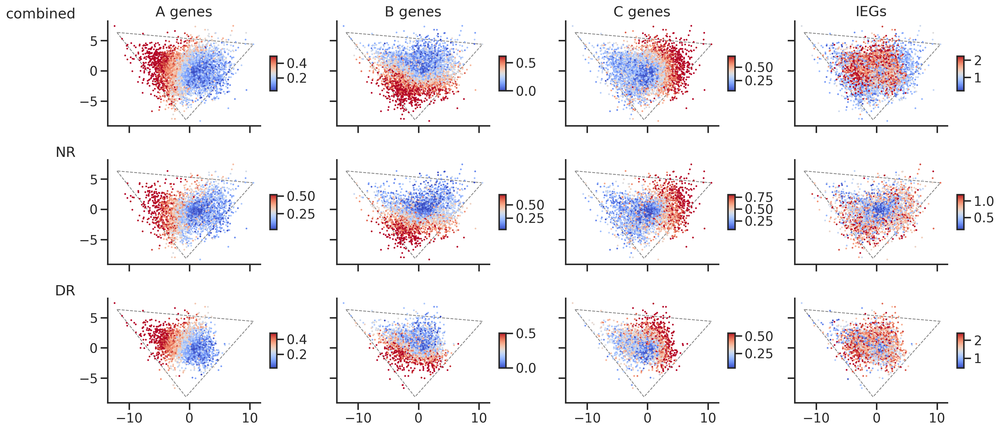

In [18]:
gns = [agenes, bgenes, cgenes, iegs]
titles = ['A genes', 'B genes', 'C genes', 'IEGs']
adatas = [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
]
conditions = ['combined', 'NR', 'DR']

fig, axss = plt.subplots(3,4,figsize=(4*5,3*3), sharex=True, sharey=True)
for i, (axs, adatasub, condition) in enumerate(zip(axss, adatas, conditions)):
    condition = conditions[i]
    for j, (ax, gn, title,) in enumerate(zip(axs, gns, titles)):
        g = adatasub[:,gn].layers['ljnorm'].mean(axis=1)
        x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
        y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
        
        p = utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=5, cmap='coolwarm', vmin_p=5, vmax_p=95)
        colorbar = plt.colorbar(p, aspect=5, shrink=0.3)
        
        # Show ticks but no grid
        ax.set_aspect('equal')
        ax.axis('on')
        ax.grid(False)  # Turn off grid lines
        sns.despine(ax=ax)
        ax.tick_params(axis='both', which='both', bottom=True, left=True)
        
        if i == 0:
            ax.set_title(title)
        if j == 0:
            ax.set_ylabel(condition, rotation=0, loc='top')
            
        # add the triangle
        add_triangle(XC, ax)
plt.show()

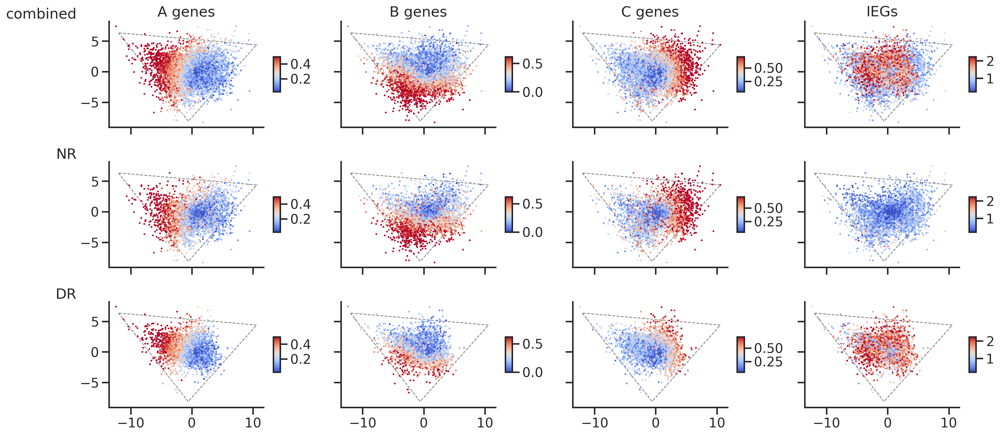

In [19]:
gns = [agenes, bgenes, cgenes, iegs]
titles = ['A genes', 'B genes', 'C genes', 'IEGs']
adatas = [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
]
conditions = ['combined', 'NR', 'DR']

fig, axss = plt.subplots(3,4,figsize=(4*5,3*3), sharex=True, sharey=True)
for i, (axs, adatasub, condition) in enumerate(zip(axss, adatas, conditions)):
    condition = conditions[i]
    for j, (ax, gn, title,) in enumerate(zip(axs, gns, titles)):
        g = adatasub[:,gn].layers['ljnorm'].mean(axis=1)
        x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
        y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
        
        # consistent over
        g0 = adata[:,gn].layers['ljnorm'].mean(axis=1)
        vmin = np.percentile(g0,  5)
        vmax = np.percentile(g0, 95)
            
        p = utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=5, cmap='coolwarm', vmin=vmin, vmax=vmax)
        colorbar = plt.colorbar(p, aspect=5, shrink=0.3)
        
        # Show ticks but no grid
        ax.set_aspect('equal')
        ax.axis('on')
        ax.grid(False)  # Turn off grid lines
        sns.despine(ax=ax)
        ax.tick_params(axis='both', which='both', bottom=True, left=True)
        
        if i == 0:
            ax.set_title(title)
        if j == 0:
            ax.set_ylabel(condition, rotation=0, loc='top')
            
        # add the triangle
        add_triangle(XC, ax)
plt.show()

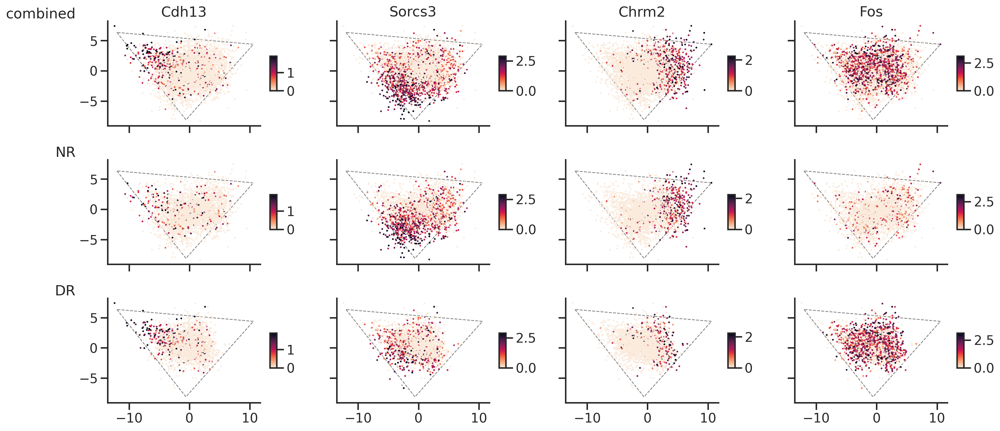

In [20]:
gns = ['Cdh13', 'Sorcs3', 'Chrm2', 'Fos']
titles = gns
adatas = [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
]
conditions = ['combined', 'NR', 'DR']

fig, axss = plt.subplots(3,4,figsize=(4*5,3*3), sharex=True, sharey=True)
for i, (axs, adatasub, condition) in enumerate(zip(axss, adatas, conditions)):
    condition = conditions[i]
    for j, (ax, gn, title,) in enumerate(zip(axs, gns, titles)):
        g = adatasub[:,gn].layers['ljnorm'].reshape(-1,)
        x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
        y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
        
        # consistent over
        g0 = adata[:,gn].layers['ljnorm'].mean(axis=1)
        vmin = np.percentile(g0,  5)
        vmax = np.percentile(g0, 99)
            
        p = utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=5, vmin=vmin, vmax=vmax)
        colorbar = plt.colorbar(p, aspect=5, shrink=0.3)
        
        # Show ticks but no grid
        ax.set_aspect('equal')
        ax.axis('on')
        ax.grid(False)  # Turn off grid lines
        sns.despine(ax=ax)
        ax.tick_params(axis='both', which='both', bottom=True, left=True)
        
        if i == 0:
            ax.set_title(title)
        if j == 0:
            ax.set_ylabel(condition, rotation=0, loc='top')
            
        add_triangle(XC, ax)
plt.show()

[-12. -11. -10.  -9.  -8.  -7.  -6.  -5.  -4.  -3.  -2.  -1.   0.   1.
   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.]
[-7. -6. -5. -4. -3. -2. -1.  0.  1.  2.  3.  4.  5.  6.  7.]
(24, 14)
(24, 14)
(24, 14)


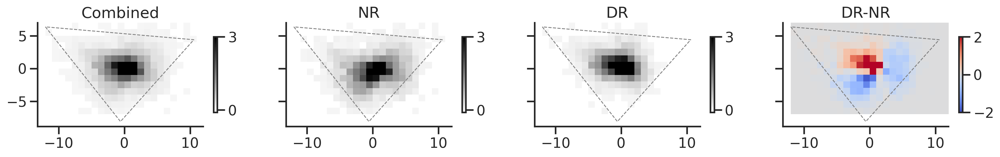

In [21]:
xmin, xmax = -12, 12
ymin, ymax = -7, 7 

bins_x = np.linspace(xmin, xmax, 1*(xmax-xmin)+1)
bins_y = np.linspace(ymin, ymax, 1*(ymax-ymin)+1)
print(bins_x)
print(bins_y)

hists = []
fig, axs = plt.subplots(1,4,figsize=(4*5,1*4), sharex=True, sharey=True)
for ax, adatasub, cond in zip(axs, [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
    ], 
    ['Combined', 'NR', 'DR']):
    x =  xsign*adatasub.obsm['pcs_typegenes'][:,xi]
    y =  ysign*adatasub.obsm['pcs_typegenes'][:,yi]
    sns.histplot(x=x, y=y, ax=ax, bins=(bins_x, bins_y), 
                 cmap='gray_r', 
                 stat='percent', vmin=-0.1, vmax=3, 
                 cbar=True, cbar_kws=dict(shrink=0.4, ticks=[0,3]))
    # sns.kdeplot(x=x, y=y, ax=ax, bins=(bins_x, bins_y))
    
    hist, _, _= np.histogram2d(x, y, bins=(bins_x, bins_y))
    hist = hist/len(x)*100
    hists.append(hist)
    print(hist.shape)
    ax.set_title(cond)
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.grid(False)
    
    # g = ax.imshow(pd.DataFrame(np.log2(1e-3+hist), 
    #                          index=bins_x[1:]-0.5, 
    #                          columns=bins_y[1:]-0.5).T, 
    #             origin='lower',
    #             extent=(xmin, xmax, ymin, ymax),
    #             cmap='gray_r') # , vmax=1, vmin=-1)
    
    # add the triangle
    add_triangle(XC, ax, zorder=2)
    
ax = axs[3] 
ax.set_title('DR-NR')
g = ax.imshow(
    # pd.DataFrame(np.log2(1e-3+hists[2])-np.log2(1e-3+hists[1]), #-hists[1], 
    pd.DataFrame(hists[2]-hists[1], #-hists[1], 
                         index=bins_x[1:]-0.5, 
                         columns=bins_y[1:]-0.5).T, 
            origin='lower',
            extent=(xmin, xmax, ymin, ymax),
            cmap='coolwarm', vmax=2, vmin=-2)
# ax.invert_yaxis()
ax.set_aspect('equal')
ax.grid(False)
fig.colorbar(g, shrink=0.4, ticks=[-2,0,2])
sns.despine(ax=ax)

# add the triangle
add_triangle(XC, ax, zorder=2)

plt.show()

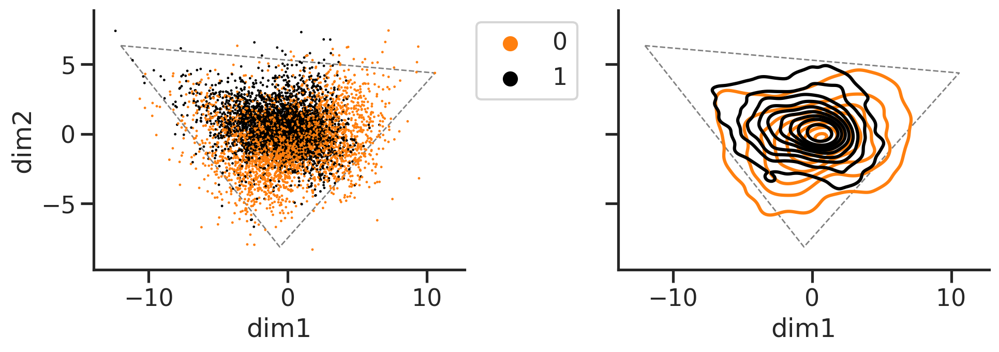

In [22]:
dfshow = adata.obs.copy()
dfshow['nrdr'] = dfshow['sample'].str.contains('DR').astype(int)
dfshow['dim1'] = xsign*adata.obsm['pcs_typegenes'][:,xi]
dfshow['dim2'] = ysign*adata.obsm['pcs_typegenes'][:,yi]
palette = {0: 'C1', 1: 'black'}


fig, axs = plt.subplots(1,2,figsize=(2*5,1*4), sharex=True, sharey=True) 
ax = axs[0]
add_triangle(XC, ax)
sns.scatterplot(data=dfshow.sample(frac=1), x='dim1', y='dim2', hue='nrdr', s=3, edgecolor='none', palette=palette, ax=ax)
ax.set_aspect('equal')
sns.despine(ax=ax)
ax.grid(False)
ax.legend(bbox_to_anchor=(1,1))

ax = axs[1]
add_triangle(XC, ax)
sns.kdeplot(data=dfshow, x='dim1', y='dim2', hue='nrdr', palette=palette, legend=False, ax=ax,)
ax.set_aspect('equal')
sns.despine(ax=ax)
ax.grid(False)


fig.tight_layout()
plt.show()

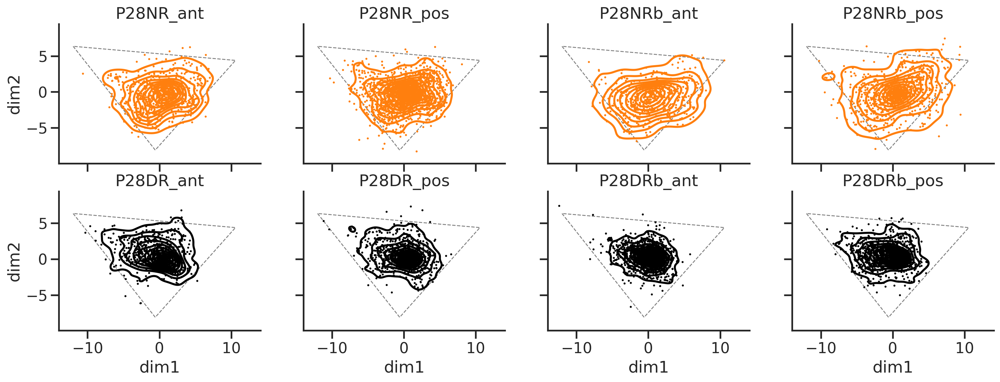

In [23]:
fig, axs = plt.subplots(2,4,figsize=(4*4,2*3), sharex=True, sharey=True) 
for sample, ax in zip(names, axs.flat):
    add_triangle(XC, ax)
    sns.scatterplot(data=dfshow[dfshow['sample']==sample].sample(frac=1), 
                    x='dim1', y='dim2', hue='nrdr', s=5, edgecolor='none', palette=palette, ax=ax, legend=False)
    sns.kdeplot(data=dfshow[dfshow['sample']==sample],
                x='dim1', y='dim2', hue='nrdr', palette=palette, legend=False, ax=ax,)
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.set_title(sample)
    ax.grid(False)
    # ax.legend(bbox_to_anchor=(1,1))

fig.tight_layout()
plt.show()

# distances to nearest archetype

In [24]:
def get_dists_to_specialists(prj, XC):
    """
    """
    diffs = np.array([prj-XC[:,0], prj-XC[:,1], prj-XC[:,2]]) # specialist by cell by dim
    dists = np.sqrt(np.sum(np.power(diffs, 2), axis=2)) # specialist by cell
    # print(diffs.shape, dists.shape)
    return dists

In [25]:
dists_dict = {}
for cond in ['NR', 'DR']:
    dists = get_dists_to_specialists(dfshow.loc[dfshow['sample'].str.contains(cond), ['dim1', 'dim2']].values, XC)
    dists_dict[cond] = dists
    

In [26]:
res_frac = pd.DataFrame(index=['A pole', 'B pole', 'C pole'])

for cond in ['NR', 'DR']:
    unqs, cnts = np.unique(np.argmin(dists_dict[cond], axis=0), return_counts=True)
    print(unqs, cnts/cnts.sum())
    res_frac[cond] = cnts/cnts.sum()

[0 1 2] [0.04682702 0.77610031 0.17707267]
[0 1 2] [0.07231638 0.83864407 0.08903955]


In [27]:
res_frac['DR']/res_frac['NR']

A pole    1.544330
B pole    1.080587
C pole    0.502842
dtype: float64

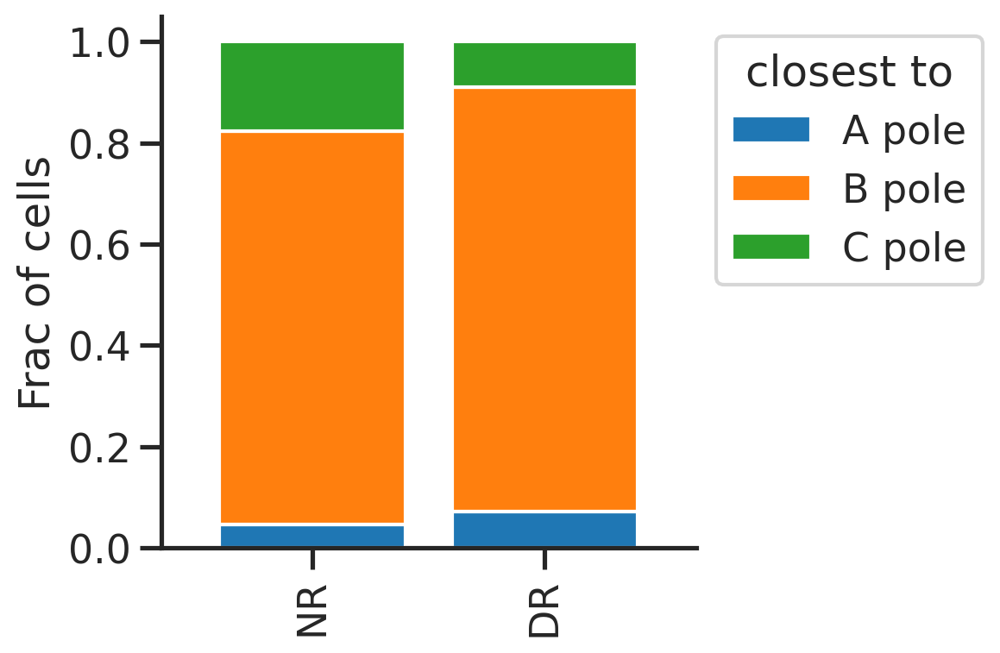

In [28]:
fig, ax = plt.subplots(figsize=(4,4))
# res_frac[['P28NR', 'P38NR', 'P28DR', 'P38DR', 'P28DL']].T.plot.bar(
res_frac.T.plot.bar(
    ax=ax, stacked=True, width=0.8,  
)
ax.legend(bbox_to_anchor=(1,1), title='closest to')
sns.despine(ax=ax)
ax.set_ylabel('Frac of cells')
ax.grid(False)
# output = os.path.join(outfigdir, 'bar_frac_abc_pole.pdf')
# powerplots.savefig_autodate(fig, output)
plt.show()


# ABC scores - expression level distributions

In [29]:
ascores_nr = -adata[adata.obs['sample'].str.contains(f'NR')][:,agenes].layers['ljnorm'].mean(axis=1)
ascores_dr = -adata[adata.obs['sample'].str.contains(f'DR')][:,agenes].layers['ljnorm'].mean(axis=1)

bscores_nr = -adata[adata.obs['sample'].str.contains(f'NR')][:,bgenes].layers['ljnorm'].mean(axis=1)
bscores_dr = -adata[adata.obs['sample'].str.contains(f'DR')][:,bgenes].layers['ljnorm'].mean(axis=1)

cscores_nr = -adata[adata.obs['sample'].str.contains(f'NR')][:,cgenes].layers['ljnorm'].mean(axis=1)
cscores_dr = -adata[adata.obs['sample'].str.contains(f'DR')][:,cgenes].layers['ljnorm'].mean(axis=1)

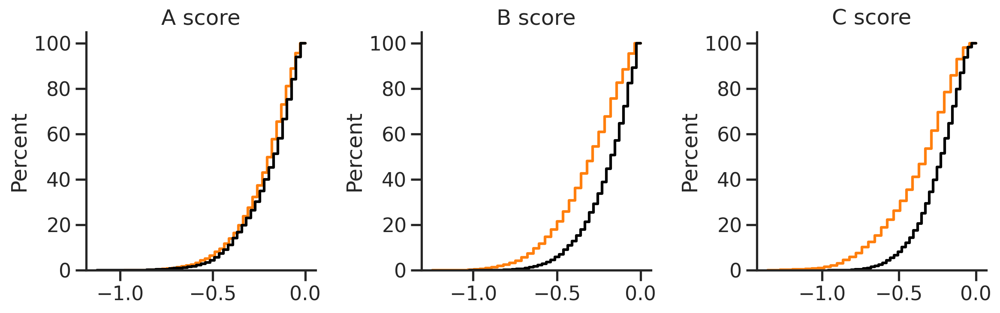

In [30]:
fig, axs = plt.subplots(1,3, figsize=(3*4,4), sharex=False, sharey=False)

ax = axs[0]
sns.histplot(ascores_nr, ax=ax, stat='percent', cumulative=True, element='step', fill=False, color='C1')
sns.histplot(ascores_dr, ax=ax, stat='percent', cumulative=True, element='step', fill=False, color='black')
ax.set_title('A score')
sns.despine(ax=ax)
ax.grid(False)

ax = axs[1]
sns.histplot(bscores_nr, ax=ax, stat='percent', cumulative=True, element='step', fill=False, color='C1')
sns.histplot(bscores_dr, ax=ax, stat='percent', cumulative=True, element='step', fill=False, color='black')
ax.set_title('B score')
sns.despine(ax=ax)
ax.grid(False)

ax = axs[2]
sns.histplot(cscores_nr, ax=ax, stat='percent', cumulative=True, element='step', fill=False, color='C1')
sns.histplot(cscores_dr, ax=ax, stat='percent', cumulative=True, element='step', fill=False, color='black')
ax.set_title('C score')
sns.despine(ax=ax)
ax.grid(False)

fig.tight_layout()
plt.show()

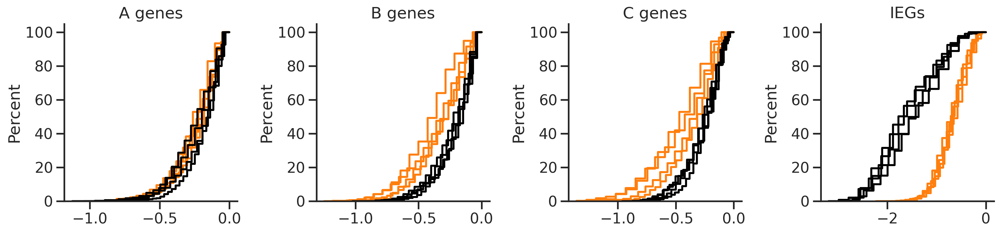

In [31]:
fig, axs = plt.subplots(1,4, figsize=(4*4,4), sharex=False, sharey=False)
for ax, genegroup, title in zip(axs, 
                                [agenes, bgenes, cgenes, iegs], 
                                ['A genes', 'B genes', 'C genes', 'IEGs'],
                               ):
    for sample in names:
        ascores_ = -adata[adata.obs['sample']==sample][:,genegroup].layers['ljnorm'].mean(axis=1)
        if 'NR' in sample:
            color = 'C1'
        elif 'DR' in sample:
            color = 'black'

        sns.histplot(ascores_, ax=ax, stat='percent', cumulative=True, element='step', fill=False, color=color)
    ax.set_title(title)
    sns.despine(ax=ax)
    ax.grid(False)

fig.tight_layout()
plt.show()

# customized colormap 

In [32]:
sns.color_palette('tab20')

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

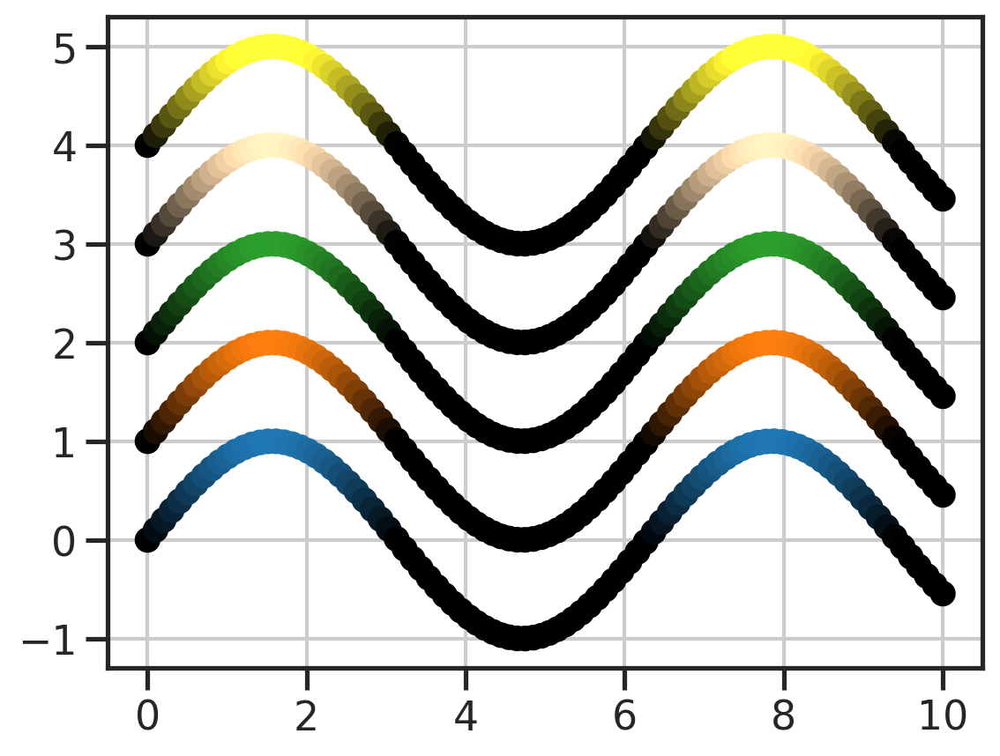

In [33]:
from matplotlib.colors import LinearSegmentedColormap

# Define custom colormap colors and positions
# colors_a = [(0.0, 'lightgray'), (1.0, 'C0')]      
# colors_b = [(0.0, 'lightgray'), (1.0, 'C1')]      
# colors_c = [(0.0, 'lightgray'), (1.0, 'C2')]      

# colors_a = [(0.0, 'black'), (0.5, sns.color_palette('tab20')[1]), (1.0, 'C0')]      
# colors_b = [(0.0, 'black'), (0.5, sns.color_palette('tab20')[3]), (1.0, 'C1')]      
# colors_c = [(0.0, 'black'), (0.5, sns.color_palette('tab20')[5]), (1.0, 'C2')]      

colors_a = [(0.0, 'black'), (1.0, 'C0')]      
colors_b = [(0.0, 'black'), (1.0, 'C1')]      
colors_c = [(0.0, 'black'), (1.0, 'C2')]      

# Create a custom colormap using LinearSegmentedColormap
cmap_a = LinearSegmentedColormap.from_list('cmap_a', colors_a)
cmap_b = LinearSegmentedColormap.from_list('cmap_b', colors_b)
cmap_c = LinearSegmentedColormap.from_list('cmap_c', colors_c)

# Generate some sample data
x = np.linspace(0, 10, 100)
y = np.sin(x)
plt.scatter(x, y,   c=cmap_a(y))
plt.scatter(x, y+1, c=cmap_b(y))
plt.scatter(x, y+2, c=cmap_c(y))

plt.scatter(x, y+3, c=np.clip(cmap_a(y)+cmap_b(y), 0, 1))
plt.scatter(x, y+4, c=np.clip(cmap_b(y)+cmap_c(y), 0, 1))
# plt.scatter(x, y+5, c=cmap_c(y))

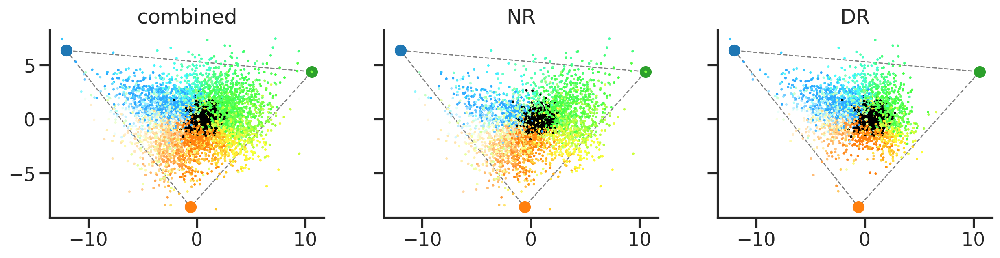

In [34]:
gns = [agenes, bgenes, cgenes, iegs]
titles = ['A genes', 'B genes', 'C genes',] #  'IEGs']
adatas = [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
]
conditions = ['combined', 'NR', 'DR']

# consistent vmin vmax
vmin_p, vmax_p = 50, 95
g0_a = adata[:,agenes].layers['ljnorm'].mean(axis=1)
vmin_a = np.percentile(g0_a, vmin_p)
vmax_a = np.percentile(g0_a, vmax_p)

g0_b = adata[:,bgenes].layers['ljnorm'].mean(axis=1)
vmin_b = np.percentile(g0_b, vmin_p)
vmax_b = np.percentile(g0_b, vmax_p)

g0_c = adata[:,cgenes].layers['ljnorm'].mean(axis=1)
vmin_c = np.percentile(g0_c, vmin_p)
vmax_c = np.percentile(g0_c, vmax_p)

fig, axs = plt.subplots(1,3,figsize=(3*5,1*3), sharex=True, sharey=True)
for i, (ax, adatasub, condition) in enumerate(zip(axs, adatas, conditions)):
    condition = conditions[i]
    x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
    y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
    
    # zscore
    g_a = adatasub[:,agenes].layers['ljnorm'].mean(axis=1)
    g_b = adatasub[:,bgenes].layers['ljnorm'].mean(axis=1)
    g_c = adatasub[:,cgenes].layers['ljnorm'].mean(axis=1)
    
    # norm to [0,1]
    g_a = np.clip((g_a-vmin_a)/(vmax_a-vmin_a), 0, 1)
    g_b = np.clip((g_b-vmin_b)/(vmax_b-vmin_b), 0, 1)
    g_c = np.clip((g_c-vmin_c)/(vmax_c-vmin_c), 0, 1)
    
    # additive blending
    additive = (cmap_a(g_a)+cmap_b(g_b)+cmap_c(g_c))[:,:3]
    # normed = np.clip(additive, 0,1)
    # normed = additive/np.max(additive, axis=1).reshape(-1,1) # , 1, None)
    normed = additive/(1e-5+np.max(additive, axis=1).reshape(-1,1)) 
           
    p = ax.scatter(x, y, c=normed, s=5, edgecolor='none')
        
    # Show ticks but no grid
    ax.set_aspect('equal')
    ax.axis('on')
    ax.grid(False)  # Turn off grid lines
    sns.despine(ax=ax)
    ax.tick_params(axis='both', which='both', bottom=True, left=True)
    ax.set_title(condition)

    # add the triangle
    add_triangle(XC, ax, vertices=True)
# plt.show()

# visualize FISH

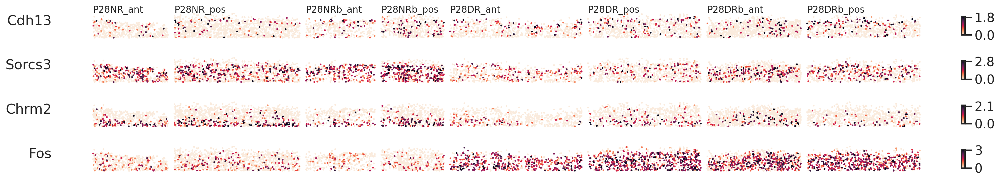

In [35]:
gns = ['Cdh13', 'Sorcs3', 'Chrm2', 'Fos'] 
x =  adata.obs['width_show2']
y =  adata.obs['depth_show2']
n = len(gns)

fig, axs = plt.subplots(n,1,figsize=(1*25,n*1))
for i, (ax, gn) in enumerate(zip(axs, gns)):
    if i == 0:
        for lbl, coord in width_cum.items():
            ax.text(coord, 0, lbl, fontsize=12)
    
    g = np.log2(1+adata[:,gn].layers['jnorm'].reshape(-1,))
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  5)
    sorting = np.argsort(g)
    
    p = utils_merfish.st_scatter_ax(fig, ax,  x[sorting],  y[sorting],  gexp=g[sorting], s=5, title='', vmin=vmin, vmax=vmax, cmap='rocket_r')
    ax.set_title(gn, loc='left', va='center', ha='right', y=0.5, pad=None)
    fig.colorbar(p, pad=0, shrink=0.5, aspect=5, ticks=[np.round(vmin, decimals=1), np.round(vmax-0.1, decimals=1)])
    
plt.show()
    

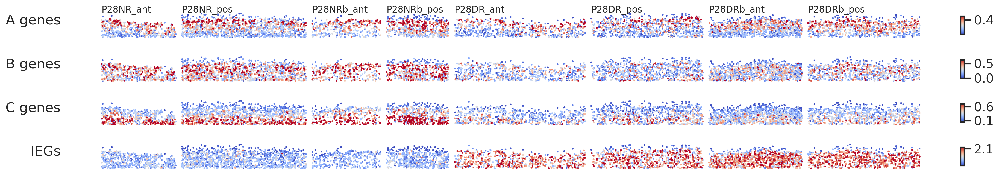

In [36]:
x =  adata.obs['width_show2']
y =  adata.obs['depth_show2']
gns = [agenes, bgenes, cgenes, iegs] 
titles = ['A genes', 'B genes', 'C genes', 'IEGs']
n = len(gns)

fig, axs = plt.subplots(n,1,figsize=(1*25,n*1))
for i, (ax, gn, title) in enumerate(zip(axs, gns, titles)):
    if i == 0:
        for lbl, coord in width_cum.items():
            ax.text(coord, 0, lbl, fontsize=12)
    
    g = adata[:,gn].layers['ljnorm'].mean(axis=1)
    sorting = np.argsort(g)
    
    vmin = np.percentile(g,  5)
    vmax = np.percentile(g, 95)
    p = utils_merfish.st_scatter_ax(fig, ax, x[sorting], y[sorting], gexp=g[sorting], 
                                    s=5, title='', vmin=vmin, vmax=vmax, cmap='coolwarm') #, axis_off=False)
    ax.set_title(title, loc='left', va='center', ha='right', y=0.5, pad=None)
    fig.colorbar(p, pad=0, shrink=0.5, aspect=5, ticks=[np.round(vmin, decimals=1), np.round(vmax-0.1, decimals=1)])
    
plt.show()
    

# stats

In [37]:
stats = {}
bins = np.linspace(0, 400, 12)

for name in names:
    adatasub = adata[adata.obs['sample']==name]# v1l23_data[name]
    lnorm_mean, lnorm_sem, lnorm_std, n, d, db = binning_pipe2(adatasub, 'depth', 'ljnorm', bins=bins)
    stats[name] = (lnorm_mean, lnorm_sem, lnorm_std, n, d, db)
d.value_counts()

(0.0, 36.364]           2
(36.364, 72.727]       13
(72.727, 109.091]      34
(109.091, 145.455]     86
(145.455, 181.818]    137
(181.818, 218.182]    155
(218.182, 254.545]    152
(254.545, 290.909]    133
(290.909, 327.273]    148
(327.273, 363.636]    130
(363.636, 400.0]      111
dtype: int64

In [38]:
# mean expression level across V1 L2/3 in NR
base_a0 = []
base_b0 = []
base_c0 = []
base_i0 = []
for name in [
    'P28NR_ant', 'P28NR_pos', 'P28NRb_ant', 'P28NRb_pos',]:
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, db) = stats[name]
    base_a = np.mean(lnorm_mean.iloc[:,agenes_idx], axis=0) # across depth bins for each gene
    base_b = np.mean(lnorm_mean.iloc[:,bgenes_idx], axis=0) # across depth bins for each gene
    base_c = np.mean(lnorm_mean.iloc[:,cgenes_idx], axis=0) # across depth bins for each gene
    base_i = np.mean(lnorm_mean.iloc[:,igenes_idx], axis=0) # across depth bins for each gene
    
    base_a0.append(base_a)
    base_b0.append(base_b)
    base_c0.append(base_c)
    base_i0.append(base_i)
    
base_a0 = np.mean(base_a0, axis=0)
base_b0 = np.mean(base_b0, axis=0)
base_c0 = np.mean(base_c0, axis=0)
base_i0 = np.mean(base_i0, axis=0)

base_a0.shape, base_b0.shape, base_c0.shape, base_i0.shape

((64,), (35,), (71,), (22,))

In [39]:
means = {}
sems = {}
for name in names:
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, db) = stats[name]
    
    amean = np.mean(lnorm_mean.iloc[:,agenes_idx]-base_a0, axis=1) # a bin vector
    bmean = np.mean(lnorm_mean.iloc[:,bgenes_idx]-base_b0, axis=1) # a bin vector
    cmean = np.mean(lnorm_mean.iloc[:,cgenes_idx]-base_c0, axis=1) # a bin vector
    imean = np.mean(lnorm_mean.iloc[:,igenes_idx]-base_i0, axis=1) # a bin vector
    
    asem = np.mean(lnorm_sem.iloc[:,agenes_idx], axis=1)
    bsem = np.mean(lnorm_sem.iloc[:,bgenes_idx], axis=1)
    csem = np.mean(lnorm_sem.iloc[:,cgenes_idx], axis=1)
    isem = np.mean(lnorm_sem.iloc[:,igenes_idx], axis=1)
    
    means[name] = [amean, bmean, cmean, imean]
    sems[name] = [asem, bsem, csem, isem]
    

In [40]:
midpoints = np.mean(np.vstack([bins[:-1], bins[1:]]), axis=0)
midpoints

array([ 18.18181818,  54.54545455,  90.90909091, 127.27272727,
       163.63636364, 200.        , 236.36363636, 272.72727273,
       309.09090909, 345.45454545, 381.81818182])

In [41]:
names

['P28NR_ant',
 'P28NR_pos',
 'P28NRb_ant',
 'P28NRb_pos',
 'P28DR_ant',
 'P28DR_pos',
 'P28DRb_ant',
 'P28DRb_pos']

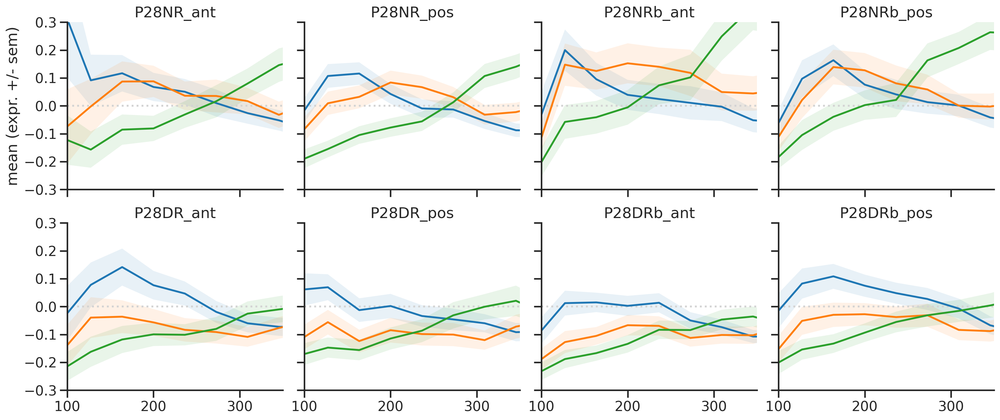

In [42]:
gnames = ['A genes (n=64)', 'B genes (n=35)', 'C genes (n=71)']

fig, axs = plt.subplots(2, 4, figsize=(5*4,4*2), sharex=True, sharey=True)

# ax.set_title('P28NR')
linestyle = '-'
for ax, name in zip(axs.flat, names):
    # (lnorm_mean, lnorm_sem, lnorm_std, n, d, db) = stats[name]
    amean, bmean, cmean, imean = means[name]
    asem, bsem, csem, isem = sems[name]
    
    x = midpoints
    ax.plot(x, amean, label='A genes', color='C0', linestyle=linestyle)
    ax.fill_between(x, amean-asem, amean+asem, color='C0', alpha=0.1, edgecolor='none')
    ax.plot(x, bmean, label='B genes', color='C1', linestyle=linestyle)
    ax.fill_between(x, bmean-bsem, bmean+bsem, color='C1', alpha=0.1, edgecolor='none')
    ax.plot(x, cmean, label='C genes', color='C2', linestyle=linestyle)
    ax.fill_between(x, cmean-csem, cmean+csem, color='C2', alpha=0.1, edgecolor='none')
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    ax.set_ylim([-0.3, 0.3])
    ax.grid(False)
    ax.set_title(name)
axs.flat[0].set_ylabel('mean (expr. +/- sem)')

    
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')

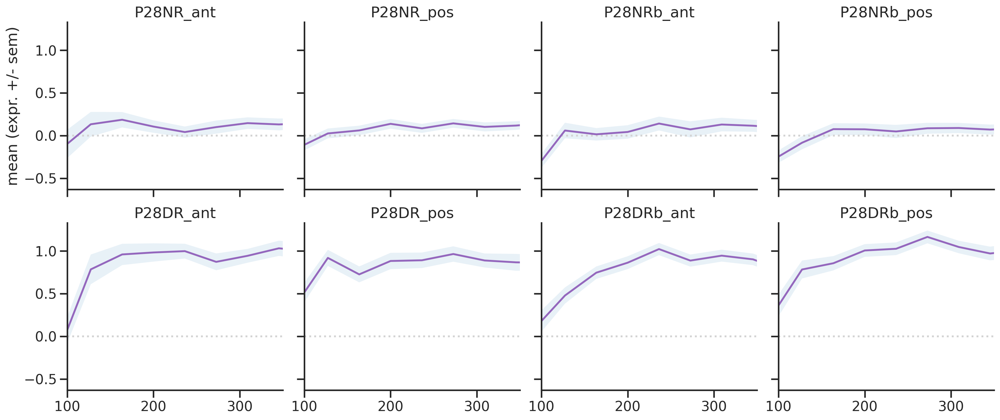

In [43]:
gnames = ['IEGs']

fig, axs = plt.subplots(2, 4, figsize=(5*4,4*2), sharex=True, sharey=True)

# ax.set_title('P28NR')
linestyle = '-'
for ax, name in zip(axs.flat, names):
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, db) = stats[name]
    amean, bmean, cmean, imean = means[name]
    asem, bsem, csem, isem = sems[name]
    
    x = midpoints
    ax.plot(x, imean, label='IEGs', color='C4', linestyle=linestyle)
    ax.fill_between(x, imean-isem, imean+isem, color='C0', alpha=0.1, edgecolor='none')
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    # ax.set_ylim([-0.3, 0.3])
    ax.grid(False)
    ax.set_title(name)
axs.flat[0].set_ylabel('mean (expr. +/- sem)')

    
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')

In [44]:
samp_gene_dpth_mat = np.array([np.array(means[name]) for name in names]) 
print(samp_gene_dpth_mat.shape) # sample, gene group, depth

nr_mat = samp_gene_dpth_mat[:4]
nr_mean = np.mean(nr_mat, axis=0) # gene group, depth
nr_sem  = np.std(nr_mat, axis=0)/np.sqrt(2) # gene group, depth

dr_mat = samp_gene_dpth_mat[4:]
dr_mean = np.mean(dr_mat, axis=0) # gene group, depth
dr_sem  = np.std(dr_mat, axis=0)/np.sqrt(2) # gene group, depth
nr_mean.shape, dr_mean.shape

(8, 4, 11)


((4, 11), (4, 11))

In [45]:
# t-test between NR and DR for each gene group and each location
from scipy import stats
from statsmodels.stats.multitest import multipletests

ts, ps = stats.ttest_ind(nr_mat, dr_mat)
rejs, qs, _, _ = multipletests(np.nan_to_num(ps, nan=1).reshape(-1,), alpha=0.05, method='fdr_bh')
qs = qs.reshape(ps.shape)
nrdr_mean = np.stack([nr_mean, dr_mean], axis=2).mean(axis=2)

In [46]:
# nr_bio_mat = np.stack([
#     np.mean(samp_gene_dpth_mat[0:2], axis=0),
#     np.mean(samp_gene_dpth_mat[2:4], axis=0),
#     ], axis=0)
# dr_bio_mat = np.stack([
#     np.mean(samp_gene_dpth_mat[4:6], axis=0),
#     np.mean(samp_gene_dpth_mat[6:8], axis=0),
#     ], axis=0)
# ts, ps = stats.ttest_ind(nr_bio_mat, dr_bio_mat)
# qs = ps
# rejs, qs, _, _ = multipletests(np.nan_to_num(ps, nan=1).reshape(-1,), alpha=0.05, method='fdr_bh')
# qs = qs.reshape(ps.shape)
# nrdr_mean = np.stack([nr_mean, dr_mean], axis=2).mean(axis=2)

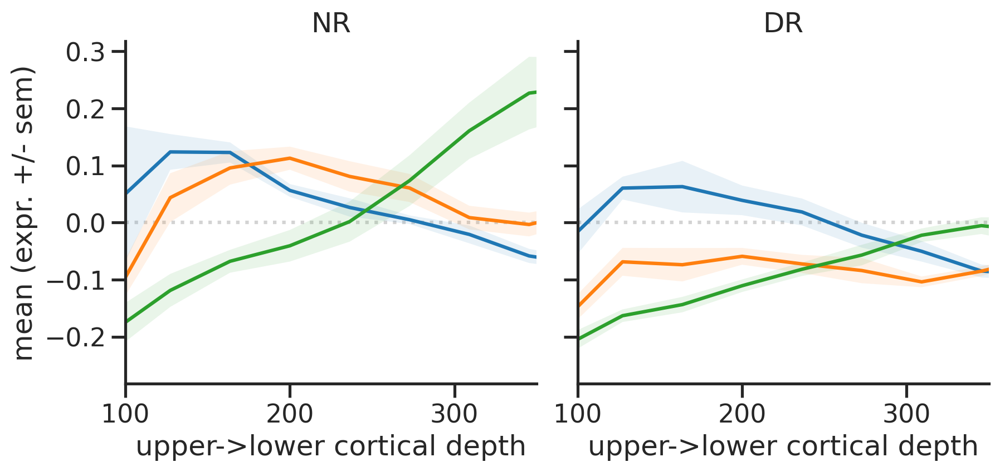

In [47]:
titles = ['NR', 'DR']
data_mean = [nr_mean, dr_mean]
data_sem = [nr_sem, dr_sem]
gnames = ['A genes', 'B genes', 'C genes']
colors = ['C0', 'C1', 'C2']

fig, axs = plt.subplots(1, 2, figsize=(5*2,4), sharex=True, sharey=True)
for ax, cond_mean, cond_sem, title in zip(axs, data_mean, data_sem, titles):
    # ax.set_title('P28NR')
    linestyle = '-'
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)
    for i, (gname, color) in enumerate(zip(gnames, colors)):
        ax.plot(midpoints, cond_mean[i], label=gname, color=color, linestyle=linestyle)
        ax.fill_between(midpoints, cond_mean[i]-cond_sem[i], cond_mean[i]+cond_sem[i], color=color, alpha=0.1, edgecolor='none')

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    # ax.set_ylim([-0.3, 0.3])
    ax.grid(False)
    ax.set_title(title)
    ax.set_xlabel('upper->lower cortical depth')
    
axs[0].set_ylabel('mean (expr. +/- sem)')
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')
plt.show()

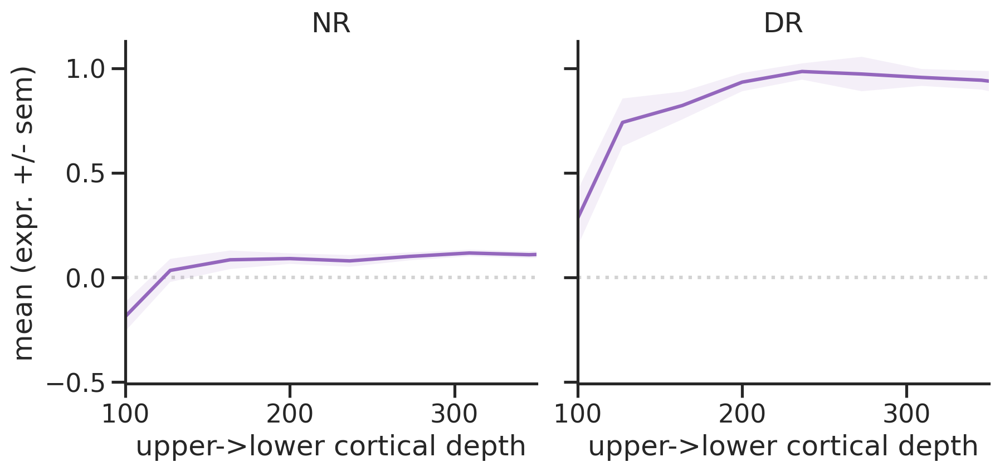

In [48]:

titles = ['NR', 'DR']
data_mean = [nr_mean, dr_mean]
data_sem = [nr_sem, dr_sem]
gnames = ['IEGs']
colors = ['C4']
i = 3

fig, axs = plt.subplots(1, 2, figsize=(5*2,4), sharex=True, sharey=True)
for ax, cond_mean, cond_sem, title in zip(axs, data_mean, data_sem, titles):
    # ax.set_title('P28NR')
    linestyle = '-'
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)
    for (gname, color) in zip(gnames, colors):
        ax.plot(midpoints, cond_mean[i], label=gname, color=color, linestyle=linestyle)
        ax.fill_between(midpoints, cond_mean[i]-cond_sem[i], cond_mean[i]+cond_sem[i], color=color, alpha=0.1, edgecolor='none')

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    # ax.set_ylim([-0.3, 0.3])
    ax.grid(False)
    ax.set_title(title)
    ax.set_xlabel('upper->lower cortical depth')
    
axs[0].set_ylabel('mean (expr. +/- sem)')
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')
plt.show()

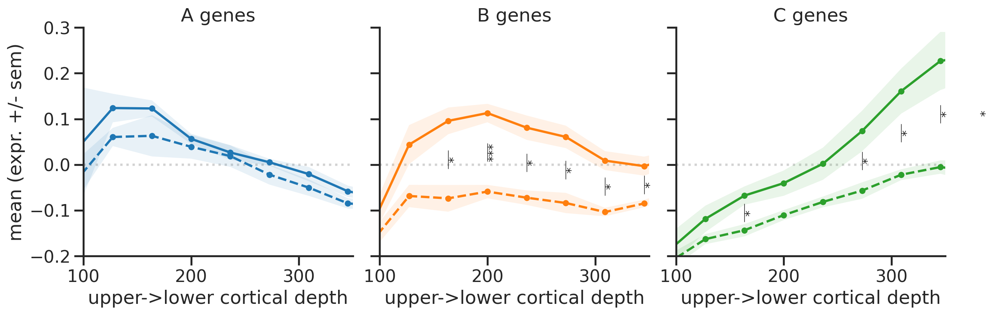

In [49]:
linestyles = ['-', '--']
data_mean = [nr_mean, dr_mean]
data_sem = [nr_sem, dr_sem]
gnames = ['A genes', 'B genes', 'C genes']
titles = gnames
colors = ['C0', 'C1', 'C2']
labels = ['NR', 'DR']
sigs = qs
allmeans = nrdr_mean

fig, axs = plt.subplots(1, 3, figsize=(5*3,4), sharex=True, sharey=True)
for i, (ax, gname, color) in enumerate(zip(axs, gnames, colors)):
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)
    for cond_mean, cond_sem, title, linestyle in zip(data_mean, data_sem, titles, linestyles):
        ax.plot(midpoints, cond_mean[i], label=gname, color=color, linestyle=linestyle, marker='o', markersize=5)
        ax.fill_between(midpoints, cond_mean[i]-cond_sem[i], cond_mean[i]+cond_sem[i], color=color, alpha=0.1, edgecolor='none')
        
    for _x, _y, _sig in zip(midpoints, allmeans[i], sigs[i]):
        if _sig < 1e-3:
            ax.text(_x, _y, "***", ha='left', va='center', fontsize=12, rotation=90)
            ax.vlines(_x, _y-0.02, _y+0.02, color='k', linewidth=0.5)
        elif _sig < 5e-2:
            ax.text(_x, _y, "*", ha='left', va='center', fontsize=12, rotation=90)
            ax.vlines(_x, _y-0.02, _y+0.02, color='k', linewidth=0.5)

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    ax.set_ylim([-0.2, 0.3])
    ax.grid(False)
    ax.set_title(gname)
    ax.set_xlabel('upper->lower cortical depth')
    
axs[0].set_ylabel('mean (expr. +/- sem)')
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')
plt.show()

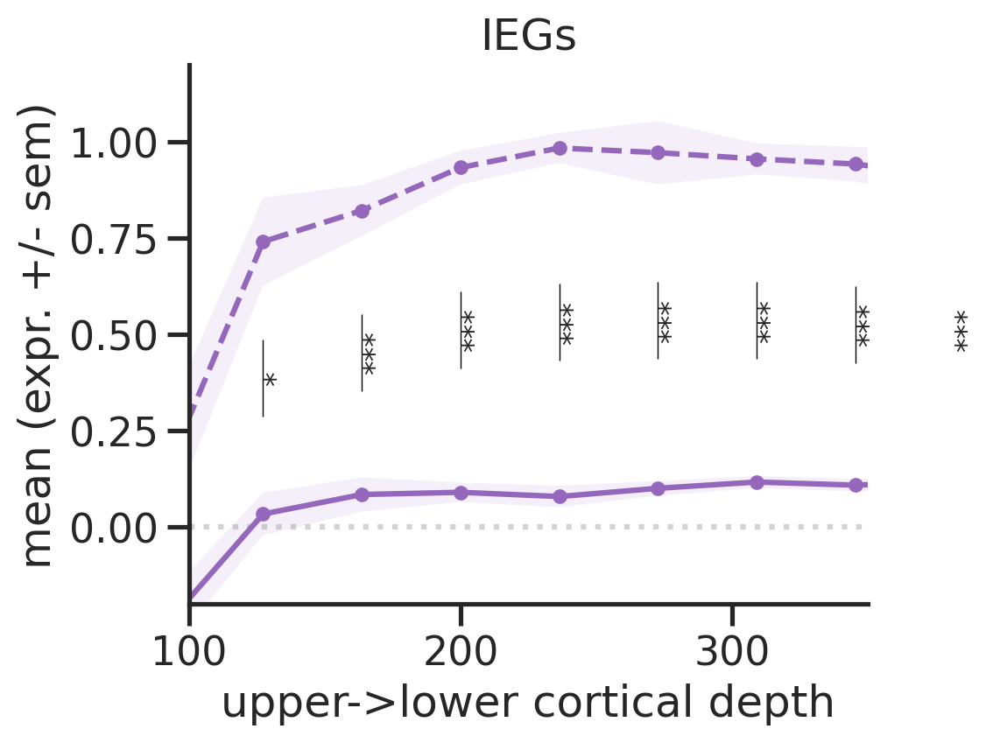

In [50]:
linestyles = ['-', '--']
data_mean = [nr_mean, dr_mean]
data_sem = [nr_sem, dr_sem]
gnames = ['IEGs']
titles = gnames
colors = ['C4']
labels = ['NR', 'DR']
i = 3
sigs = qs
allmeans = nrdr_mean

fig, ax = plt.subplots(1, 1, figsize=(5*1,4), sharex=True, sharey=True)
for (gname, color) in zip(gnames, colors):
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)
    for cond_mean, cond_sem, linestyle in zip(data_mean, data_sem, linestyles):
        ax.plot(midpoints, cond_mean[i], label=gname, color=color, linestyle=linestyle, marker='o', markersize=5)
        ax.fill_between(midpoints, cond_mean[i]-cond_sem[i], cond_mean[i]+cond_sem[i], color=color, alpha=0.1, edgecolor='none')
        
    for _x, _y, _sig in zip(midpoints, allmeans[i], sigs[i]):
        if _sig < 1e-3:
            ax.text(_x, _y, "***", ha='left', va='center', fontsize=12, rotation=90)
            ax.vlines(_x, _y-0.1, _y+0.1, color='k', linewidth=0.5)
        elif _sig < 5e-2:
            ax.text(_x, _y, "*", ha='left', va='center', fontsize=12, rotation=90)
            ax.vlines(_x, _y-0.1, _y+0.1, color='k', linewidth=0.5)

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    ax.set_ylim([-0.2, 1.2])
    ax.grid(False)
    ax.set_title(gname)
    ax.set_xlabel('upper->lower cortical depth')
    
ax.set_ylabel('mean (expr. +/- sem)')
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')
plt.show()